In [1]:
import brainsss
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy
import random
from scipy.stats import sem
import time
import h5py
import ants
import nibabel as nib
import matplotlib
import pickle
from shutil import copyfile
from mpl_toolkits.axes_grid1 import ImageGrid

/home/users/brezovec/.local/lib/python3.6/site-packages/ants/viz/render_surface_function.py:16: UserWarning: Cant import Plotly. Install it `pip install chart_studio` if you want to use ants.render_surface_function
  "Cant import Plotly. Install it `pip install chart_studio` if you want to use ants.render_surface_function"


In [2]:
directory = '/oak/stanford/groups/trc/data/Yukun/registration'

In [3]:
flies = ['210208_02', '210208_03', '210216_02', '210216_04',
         '210218_02', '210223_01', '210223_02', '210223_03', '210223_04']

In [113]:
subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220627_LC11/raw_red'
os.mkdir(subvol_directory)

In [4]:
x_start = 200
x_end = 450
y_start = 100
y_end = 350
z_start = 100
z_end = 200

In [114]:
for fly_num in flies:
    print(fly_num)
    try:
        file = os.path.join(directory, 'LC11', fly_num, 'stitched_brain_red_mean.nii')
        subvol_red = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
        file = os.path.join(directory, 'LC11', fly_num, 'stitched_brain_green_mean.nii')
        subvol_green = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
    except:
        file = os.path.join(directory, 'LC11_2', fly_num, 'stitched_brain_red_mean.nii')
        subvol_red = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
        file = os.path.join(directory, 'LC11_2', fly_num, 'stitched_brain_green_mean.nii')
        subvol_green = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
        
    ### red ###
    subvol_crop = subvol_red.copy()[x_start:x_end, y_start:y_end, z_start:z_end]
    subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220627_LC11/raw_red'
    save_file = os.path.join(subvol_directory, f'{fly_num}_red_o')
    np.save(save_file, subvol_crop)
    
    ### red mirror ###
    subvol_crop = subvol_red.copy()[::-1,:,:][x_start:x_end, y_start:y_end, z_start:z_end]
    save_file = os.path.join(subvol_directory, f'{fly_num}_red_m')
    np.save(save_file, subvol_crop)

    ### green ###
    subvol_crop = subvol_green.copy()[x_start:x_end, y_start:y_end, z_start:z_end]
    subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220627_LC11/raw_green'
    save_file = os.path.join(subvol_directory, f'{fly_num}_green_o')
    np.save(save_file, subvol_crop)
    
    ### green mirror ###
    subvol_crop = subvol_green.copy()[::-1,:,:][x_start:x_end, y_start:y_end, z_start:z_end]
    save_file = os.path.join(subvol_directory, f'{fly_num}_green_m')
    np.save(save_file, subvol_crop)

210208_02
210208_03
210216_02
210216_04
210218_02
210223_01
210223_02
210223_03
210223_04


In [107]:
subvol_crop = subvol[::-1,:,:].copy()
subvol_crop = subvol_crop[x_start:x_end, y_start:y_end, z_start:z_end]

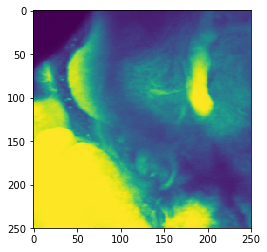

In [108]:
plt.imshow(np.max(subvol_crop,axis=-1).T)

In [155]:
file = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220627_LC11/210208_02_red_o.npy'
affine1 = np.load(file)
#affine1 = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')

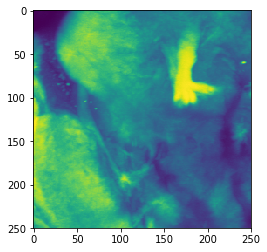

In [156]:
plt.imshow(np.max(affine1,axis=-1).T)

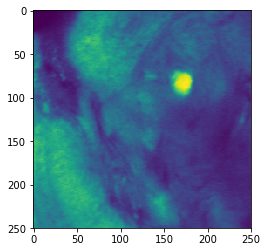

In [157]:
plt.imshow(affine1[:,:,35].T)

In [146]:
subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220627_LC11/affine_0'
os.listdir(subvol_directory)

18

In [6]:
anats

['210216_02_red_o_clean.nii',
 '210223_01_red_o_clean.nii',
 '210223_02_red_o_clean.nii',
 '210223_03_red_o_clean.nii',
 '210208_02_red_o_clean.nii',
 '210216_04_red_m_clean.nii',
 '210208_03_red_o_clean.nii',
 '210218_02_red_o_clean.nii',
 '210208_03_red_m_clean.nii',
 '210218_02_red_m_clean.nii',
 '210223_02_red_m_clean.nii',
 '210216_02_red_m_clean.nii',
 '210223_01_red_m_clean.nii',
 '210216_04_red_o_clean.nii',
 '210208_02_red_m_clean.nii']

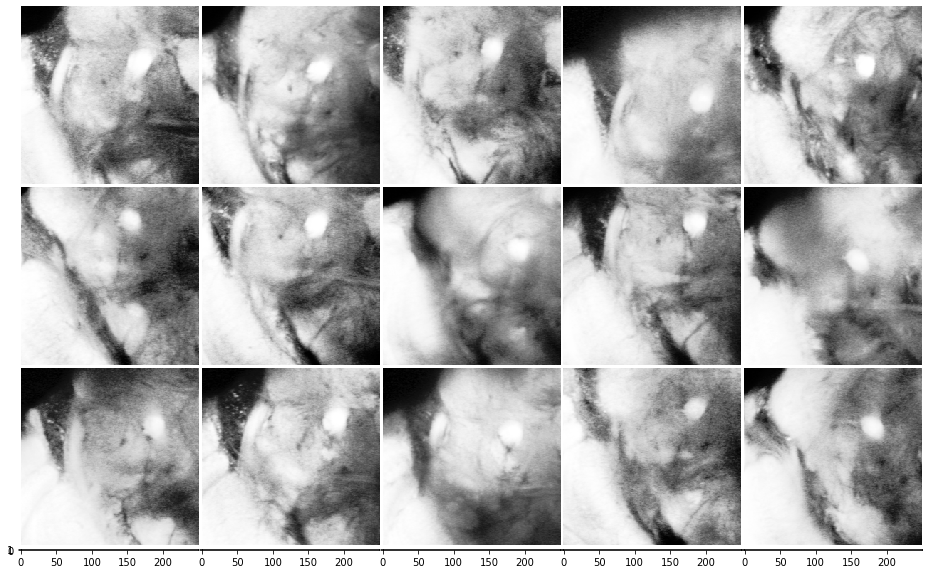

In [9]:
subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220628_LC11/clean_anats'
anats = os.listdir(subvol_directory)

fig = plt.figure(figsize=(20,10))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 5), axes_pad=.05)
for i in range(15):
    file = os.path.join(subvol_directory, anats[i])
    anat = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
    grid[i].imshow(anat[:,:,35].T,cmap='Greys_r')
    grid[i].axis('off')
    
save_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs'
timestr = time.strftime("%Y%m%d-%H%M%S")
fname = os.path.join(save_path, f'{timestr}')
plt.savefig(fname,dpi=300,bbox_inches='tight',transparent=True)

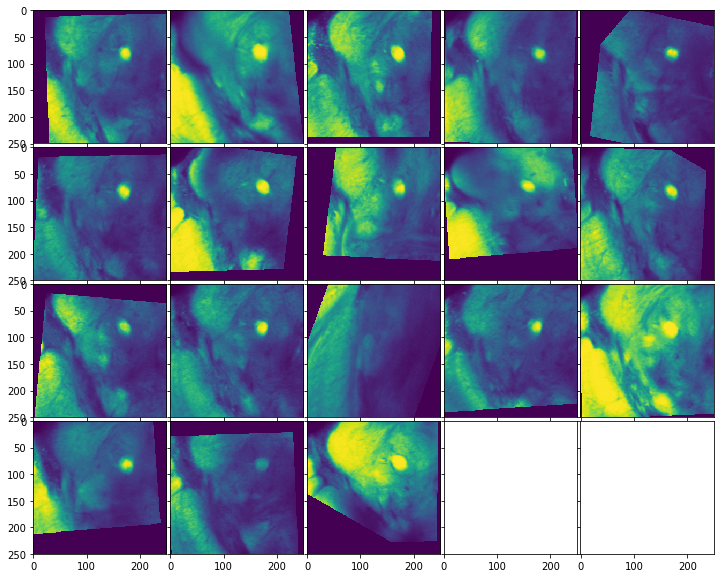

In [153]:
subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220627_LC11/affine_0'
anats = os.listdir(subvol_directory)

fig = plt.figure(figsize=(20,10))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 5), axes_pad=.05)
for i in range(18):
    file = os.path.join(subvol_directory, anats[i])
    anat = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
    grid[i].imshow(anat[:,:,35].T)

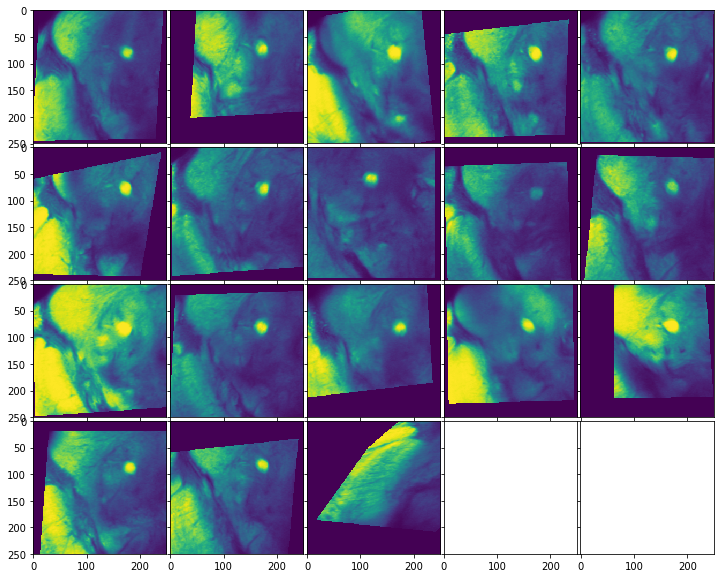

In [152]:
subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220627_LC11/affine_1'
anats = os.listdir(subvol_directory)

fig = plt.figure(figsize=(20,10))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 5), axes_pad=.05)
for i in range(18):
    file = os.path.join(subvol_directory, anats[i])
    anat = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
    grid[i].imshow(anat[:,:,35].T)

In [82]:
file = '/oak/stanford/groups/trc/data/Max/Analysis/glom_pop/sync/mean_brain/chat_meanbrain_20211217.nii'
anat = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
anat.shape

(354, 202, 45, 2)

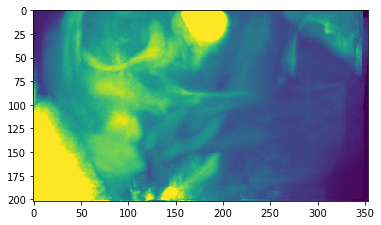

In [91]:
plt.imshow(np.max(anat[:,:,:,0],axis=2).T,vmax=2000)

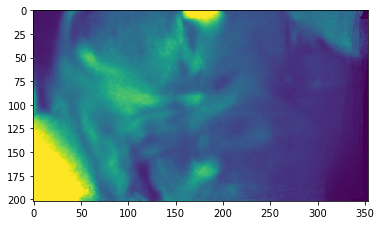

In [92]:
plt.imshow(anat[:,:,20,0].T,vmax=2000)

In [13]:
file = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/syn_4.nii'
anat = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')

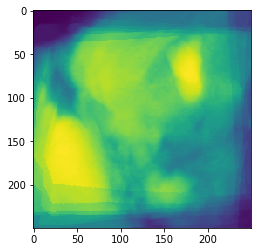

In [14]:
plt.imshow(np.max(anat[:,:,:],axis=2).T)

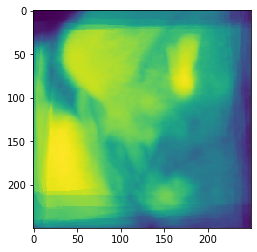

In [10]:
plt.imshow(np.max(anat[:,:,:],axis=2).T)

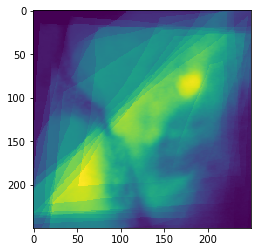

In [6]:
plt.imshow(anat[:,:,35].T)

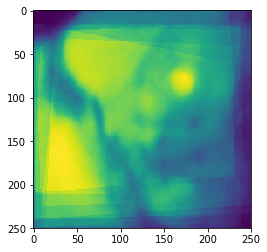

In [99]:
plt.imshow(anat[:,:,35].T)

In [16]:
for i in range(len(anats)):
    print(i, anats[i])

0 210216_02_red_o_clean.nii
1 210223_01_red_o_clean.nii
2 210223_04_red_m_clean.nii
3 210223_02_red_o_clean.nii
4 210223_04_red_o_clean.nii
5 210223_03_red_o_clean.nii
6 210208_02_red_o_clean.nii
7 210216_04_red_m_clean.nii
8 210208_03_red_o_clean.nii
9 210218_02_red_o_clean.nii
10 210208_03_red_m_clean.nii
11 210218_02_red_m_clean.nii
12 210223_03_red_m_clean.nii
13 210223_02_red_m_clean.nii
14 210216_02_red_m_clean.nii
15 210223_01_red_m_clean.nii
16 210216_04_red_o_clean.nii
17 210208_02_red_m_clean.nii


In [50]:
main_dir = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11"
name_fixed = 'clean/210208_02_red_o_clean'
fixed_path = os.path.join(main_dir, f'{name_fixed}.nii')
fixed_path

'/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/clean/210208_02_red_o_clean.nii'

In [ ]:
#delete these:
210223_04_red_m_clean.nii
210223_04_red_o_clean.nii
210223_03_red_m_clean.nii

In [21]:
anat.shape

(250, 250, 100)

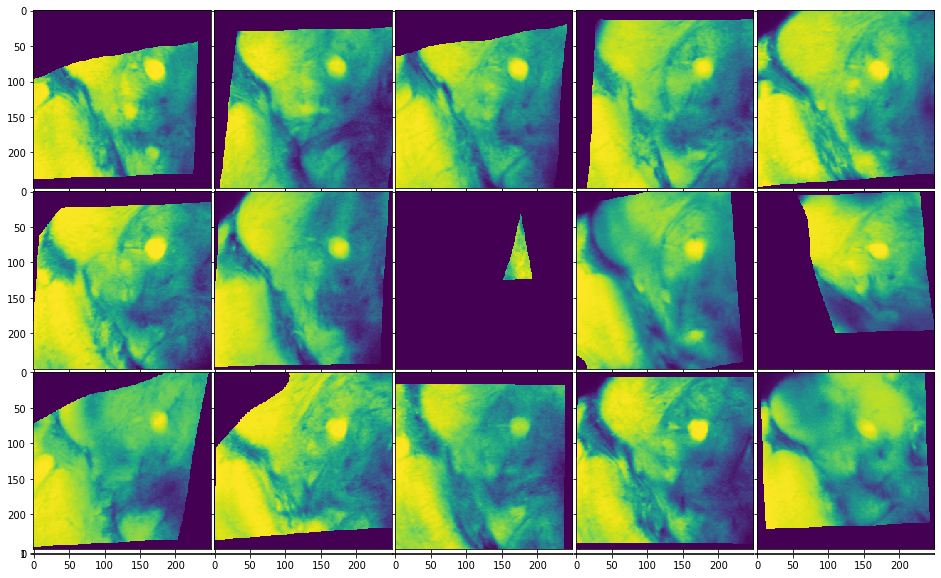

In [22]:
subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/syn_0'
anats = os.listdir(subvol_directory)

fig = plt.figure(figsize=(20,10))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 5), axes_pad=.05)
for i in range(15):
    file = os.path.join(subvol_directory, anats[i])
    anat = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
    grid[i].imshow(anat[:,:,35].T)

/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/affine_1/210216_04_red_o_clean-to-affine_0.nii
/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/affine_1/210208_03_red_m_clean-to-affine_0.nii
/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/affine_1/210218_02_red_o_clean-to-affine_0.nii
/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/affine_1/210216_02_red_m_clean-to-affine_0.nii
/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/affine_1/210223_02_red_m_clean-to-affine_0.nii
/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/affine_1/210208_02_red_o_clean-to-affine_0.nii
/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/affine_1/210223_01_red_m_clean-to-affine_0.nii
/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/affine_1/210208_03_red_o_clean-to-affine_0.nii
/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/affine_1/210208_02_red_m_clean-to-affine_0.nii
/

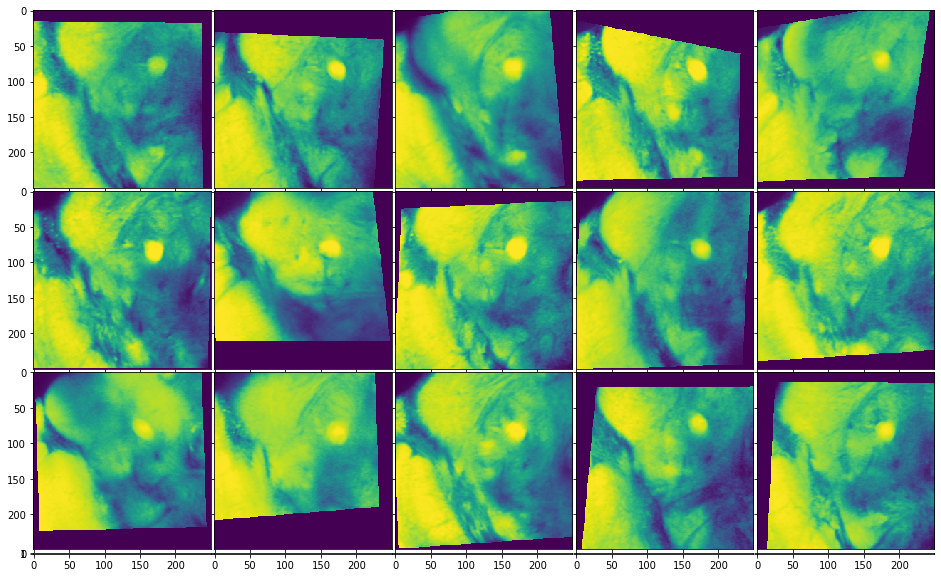

In [23]:
subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/affine_1'
anats = os.listdir(subvol_directory)

fig = plt.figure(figsize=(20,10))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 5), axes_pad=.05)
for i in range(15):
    file = os.path.join(subvol_directory, anats[i])
    print(file)
    anat = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
    grid[i].imshow(anat[:,:,35].T)

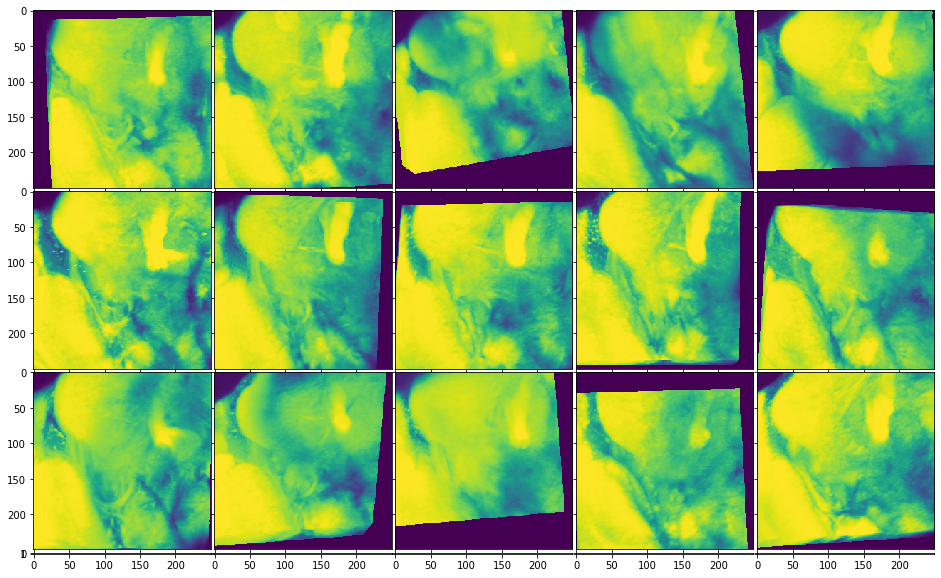

In [25]:
subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220628_LC11/affine_0'
anats = os.listdir(subvol_directory)

fig = plt.figure(figsize=(20,10))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 5), axes_pad=.05)
for i in range(15):
    file = os.path.join(subvol_directory, anats[i])
    anat = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
    grid[i].imshow(np.max(anat[:,:,:],axis=2).T)

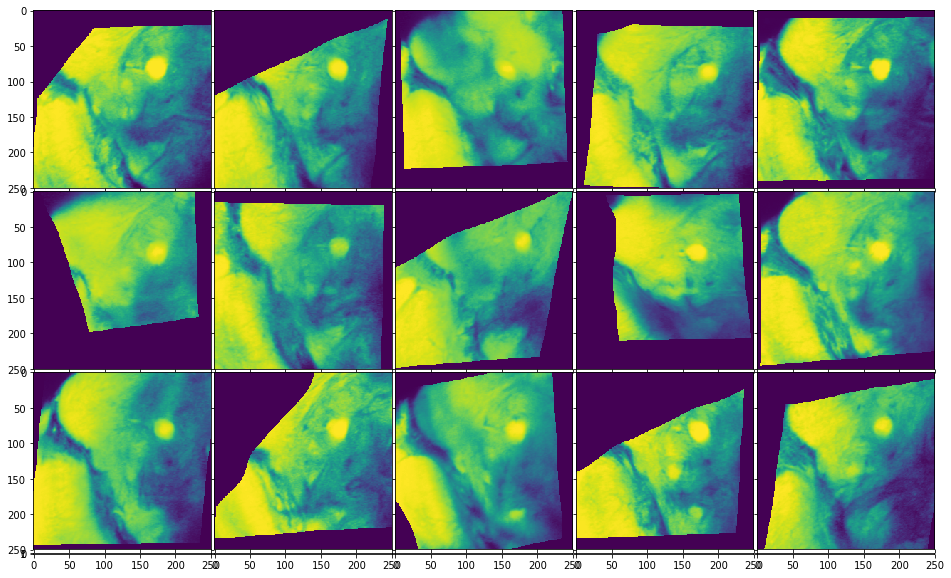

In [53]:
subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/syn_1'
anats = os.listdir(subvol_directory)

fig = plt.figure(figsize=(20,10))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 5), axes_pad=.05)
for i in range(15):
    file = os.path.join(subvol_directory, anats[i])
    anat = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
    grid[i].imshow(anat[:,:,35].T)

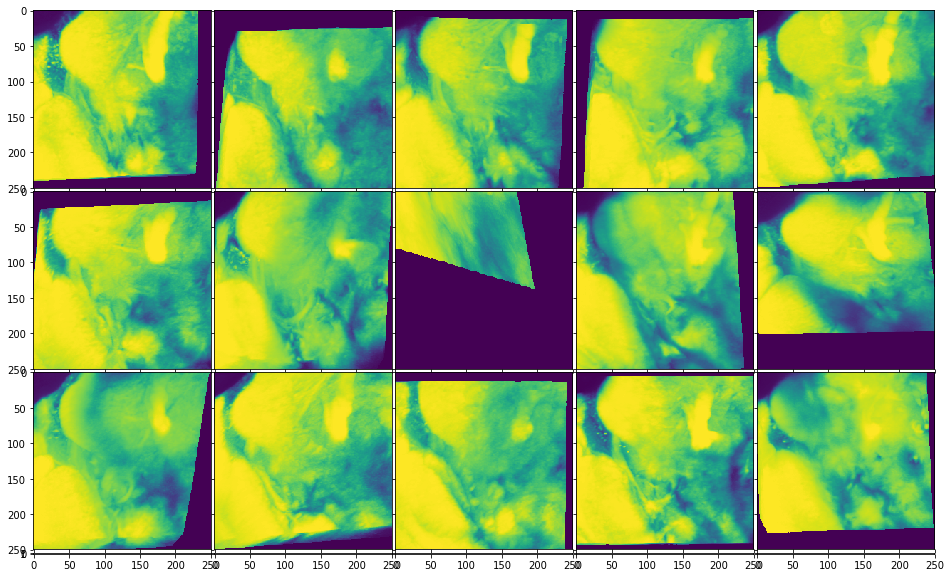

In [80]:
subvol_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/syn_0'
anats = os.listdir(subvol_directory)

fig = plt.figure(figsize=(20,10))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 5), axes_pad=.05)
for i in range(15):
    file = os.path.join(subvol_directory, anats[i])
    anat = np.asarray(nib.load(file).get_fdata().squeeze(), dtype='float32')
    grid[i].imshow(np.max(anat[:,:,:],axis=2).T)

In [2]:
os.listdir("/oak/stanford/groups/trc/data/Alex/albert_data/LC11/anat/mbrain")

['build_meanbrain.log', 'templates', 'preprocessed']

In [3]:
file = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220921_mbrain_test/templates/syn_1.nii"
img1 = ants.image_read(file)

file = "/oak/stanford/groups/trc/data/Alex/albert_data/LC11/anat/mbrain/templates/syn_1.nii"
img2 = ants.image_read(file)

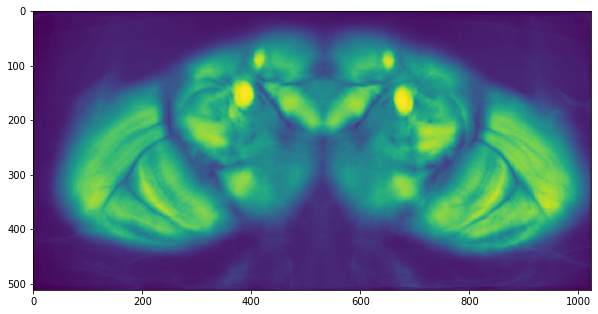

In [6]:
plt.figure(figsize=(10,10))
plt.imshow(img1[:,:,100].T)

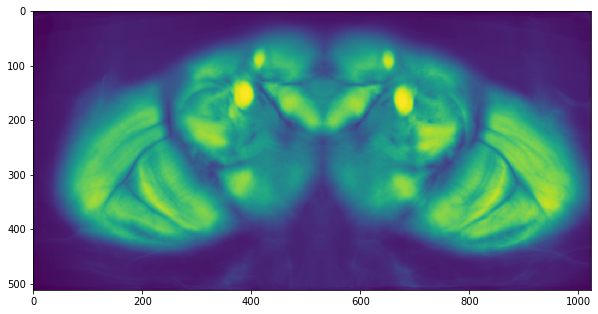

In [7]:
plt.figure(figsize=(10,10))
plt.imshow(img2[:,:,100].T)

In [9]:
os.listdir("/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/raw_red")

['210218_02_red_o.npy',
 '210218_02_red_m.npy',
 '210223_01_red_o.npy',
 '210223_02_red_o.npy',
 '210216_02_red_m.npy',
 '210208_03_red_m.npy',
 '210223_01_red_m.npy',
 '210208_02_red_m.npy',
 '210216_02_red_o.npy',
 '210223_03_red_o.npy',
 '210216_04_red_o.npy',
 '210208_03_red_o.npy',
 '210216_04_red_m.npy',
 '210208_02_red_o.npy',
 '210223_02_red_m.npy']

In [10]:
new_dir = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/raw_red_nii"
os.mkdir(new_dir)

In [14]:
andrew_dir = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/andrew_pipeline"
os.mkdir(andrew_dir)

In [12]:
### copy these to new folder for testing andrew's pipeline and convert to .nii

dir_ = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/raw_red"

for file in os.listdir(dir_):
    print(file)
    fullfile = os.path.join(dir_,file)
    brain = np.load(fullfile)
    fname = file.split('/')[-1].split('.')[0]
    save_file = os.path.join(new_dir, f'{fname}.nii')
    aff = np.eye(4)
    img = nib.Nifti1Image(brain, aff)
    img.to_filename(save_file)

210218_02_red_o.npy
210218_02_red_m.npy
210223_01_red_o.npy
210223_02_red_o.npy
210216_02_red_m.npy
210208_03_red_m.npy
210223_01_red_m.npy
210208_02_red_m.npy
210216_02_red_o.npy
210223_03_red_o.npy
210216_04_red_o.npy
210208_03_red_o.npy
210216_04_red_m.npy
210208_02_red_o.npy
210223_02_red_m.npy


In [22]:
brain.shape

(250, 250, 100)

In [13]:
os.listdir(new_dir)

['210208_02_red_m.nii',
 '210216_04_red_o.nii',
 '210208_03_red_m.nii',
 '210218_02_red_m.nii',
 '210223_02_red_m.nii',
 '210208_03_red_o.nii',
 '210223_01_red_m.nii',
 '210216_04_red_m.nii',
 '210216_02_red_o.nii',
 '210223_01_red_o.nii',
 '210216_02_red_m.nii',
 '210223_02_red_o.nii',
 '210223_03_red_o.nii',
 '210208_02_red_o.nii',
 '210218_02_red_o.nii']

In [17]:
os.listdir("/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/andrew_pipeline/templates")

['affine_0.nii', 'syn_1.nii', 'syn_0.nii']

In [314]:
file = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/andrew_pipeline/templates/syn_0.nii"
file = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/andrew_pipeline4/templates/syn_1.nii"

meansub_vol = ants.image_read(file)
meansub_vol.set_spacing((.65,.65,1))
meansub_vol = ants.resample_image(meansub_vol,(1,1,1),use_voxels=False)
meansub_vol

ANTsImage (LPI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (163, 163, 100)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.]

In [150]:
250*.65

162.5

In [315]:
meansub_vol = meansub_vol[:,:,::-1]

In [316]:
meansub_vol.shape

(163, 163, 100)

In [435]:
### TRIM
t = 20
meansub_vol = meansub_vol[t:-t,t:-t,t:-t]

In [436]:
meansub_vol.shape

(123, 123, 60)

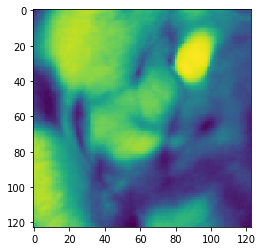

In [438]:
plt.imshow(meansub_vol[:,:,30].T)

In [11]:
def load_FDA():
    FDA_file = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/anat_templates/20220301_luke_2_jfrc_affine.nii'
    FDA = np.asarray(nib.load(FDA_file).get_fdata().squeeze(), dtype='float32')
    FDA = ants.from_numpy(FDA)
    FDA.set_spacing((.38,.38,.38))
    FDA_lowres = ants.resample_image(FDA,(1,1,1),use_voxels=False)
    return FDA, FDA_lowres

FDA, FDA_lowres = load_FDA()

In [13]:
FDA.shape

(1652, 768, 479)

In [12]:
FDA_lowres.shape

(628, 292, 182)

In [394]:
meansub_vol.shape

(163, 163, 100)

In [439]:
### width of subvol comes directly from subvol
xr = int(meansub_vol.shape[0]/2)
yr = int(meansub_vol.shape[1]/2)
zr = int(meansub_vol.shape[2]/2)
print(xr,yr,zr)

61 61 30


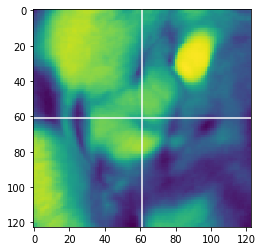

In [440]:
plt.imshow(meansub_vol[:,:,zr].T)
plt.axhline(xr,color='w')
plt.axvline(yr,color='w')

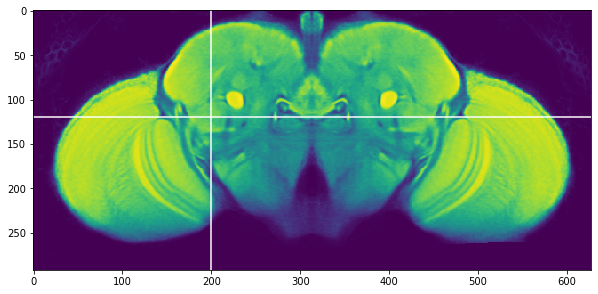

In [441]:
### user must estimate the center of their subvol on FDA
xc = 200
yc = 120
zc = 120

plt.figure(figsize=(10,10))
plt.imshow(FDA_lowres[:,:,zc].T)
plt.axvline(xc,color='w')
plt.axhline(yc,color='w')

In [442]:
FDA_lowres_cropped = FDA_lowres[xc-xr:xc+xr,yc-yr:yc+yr,zc-zr:zc+zr]

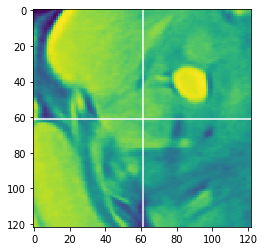

In [443]:
plt.imshow(FDA_lowres_cropped[:,:,zr].T)
plt.axhline(xr,color='w')
plt.axvline(yr,color='w')

In [444]:
fixed = ants.from_numpy(FDA_lowres_cropped)
moving = ants.from_numpy(meansub_vol)
moco = ants.registration(fixed=fixed, moving=moving, type_of_transform='SyN')

In [445]:
fixed.shape

(122, 122, 60)

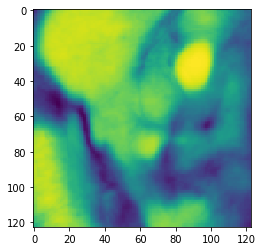

In [449]:
plt.imshow(moving[:,:,40].T)

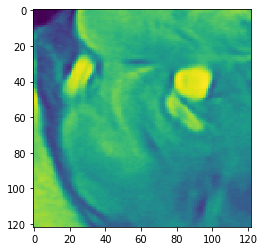

In [453]:
plt.imshow(fixed[:,:,10].T)

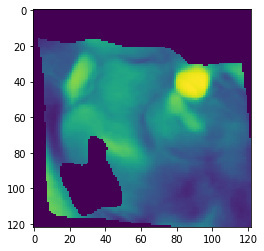

In [452]:
plt.imshow(moco['warpedmovout'][:,:,10].T)

In [109]:
subvol_mean_warped = moco['warpedmovout']

In [108]:
tag = "20220916a"


dir_ = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/andrew_pipeline/FDA_register"
save_file = os.path.join(dir_,F'{tag}_fixed')
aff = np.eye(4)
img = nib.Nifti1Image(FDA_lowres_cropped, aff)
img.to_filename(save_file)

dir_ = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/andrew_pipeline/FDA_register"
save_file = os.path.join(dir_,F'{tag}_moving')
aff = np.eye(4)
img = nib.Nifti1Image(moco['warpedmovout'].numpy(), aff)
img.to_filename(save_file)

In [88]:
ants.image_similarity(fixed,moco['warpedmovout'])

0.1982664316892624

In [ ]:
### this registration to FDA actually looks pretty good.
# to test I need to align red channels to meanbrain and apply to green channels.
# then visualize with Alex's LC11 in FDA
# crops started at (250,250,100) in 1um iso that is (160,160,100)
# after made meanbrain needed to crop out black, which brought down to (100,100,40)
# then after warping this into FDA need to crop again 
# may need to make original crop larger

In [95]:
os.listdir('/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220627_LC11/raw_green')

['210223_03_green_m.npy',
 '210223_03_green_o.npy',
 '210216_04_green_o.npy',
 '210208_02_green_o.npy',
 '210223_04_green_m.npy',
 '210218_02_green_o.npy',
 '210208_02_green_m.npy',
 '210218_02_green_m.npy',
 '210223_01_green_m.npy',
 '210216_02_green_m.npy',
 '210223_02_green_m.npy',
 '210223_04_green_o.npy',
 '210216_02_green_o.npy',
 '210208_03_green_m.npy',
 '210223_01_green_o.npy',
 '210208_03_green_o.npy',
 '210216_04_green_m.npy',
 '210223_02_green_o.npy']

In [293]:
os.listdir(red_directory)

['210218_02_red_o.npy',
 '210218_02_red_m.npy',
 '210223_01_red_o.npy',
 '210223_02_red_o.npy',
 '210216_02_red_m.npy',
 '210208_03_red_m.npy',
 '210223_04_red_m.npy',
 '210223_01_red_m.npy',
 '210208_02_red_m.npy',
 '210216_02_red_o.npy',
 '210223_03_red_o.npy',
 '210216_04_red_o.npy',
 '210208_03_red_o.npy',
 '210223_04_red_o.npy',
 '210223_03_red_m.npy',
 '210216_04_red_m.npy',
 '210208_02_red_o.npy',
 '210223_02_red_m.npy']

In [487]:
red_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220627_LC11/raw_red'
green_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220627_LC11/raw_green'

file = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/andrew_pipeline4/templates/syn_1.nii"
meansub_vol = ants.image_read(file)
### TRIM
t = 20
meansub_vol = ants.from_numpy(meansub_vol[t:-t,t:-t,t:-t])

for file in os.listdir(red_directory)[2:3]:
    red_file = os.path.join(red_directory,file)
    brain_red = ants.from_numpy(np.load(red_file))
    #green_file = os.path.join(green_directory, file.replace('red', 'green'))
    #brain_green = ants.from_numpy(np.load(green_file)[:,:,::-1])
    
    #brain_red.set_spacing((.65,.65,1))
    #brain_red = ants.resample_image(brain_red,(1,1,1),use_voxels=False)
    ### TRIM
    #t = 30
    #brain_red = ants.from_numpy(brain_red[t:-t,t:-t,t:-t])
    
    # might work better to align meansub to individual brains 
    fixed = meansub_vol
    moving = brain_red
    moco = ants.registration(fixed=fixed, moving=moving, type_of_transform='SyN')

In [481]:
fixed.shape, moco['warpedmovout'].shape, moving.shape

((210, 210, 60), (210, 210, 60), (250, 250, 100))

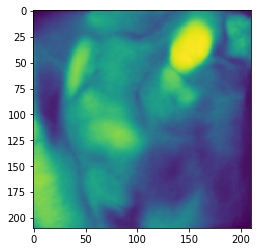

In [488]:
plt.imshow(fixed[:,:,50].T)

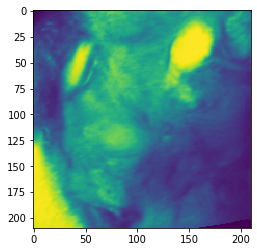

In [489]:
plt.imshow(moco['warpedmovout'][:,:,50].T)

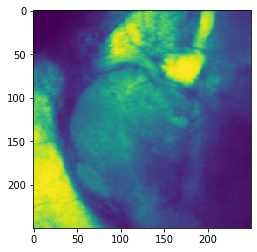

In [490]:
plt.imshow(moving[:,:,70].T)

In [115]:
moving.shape

(250, 250, 100)

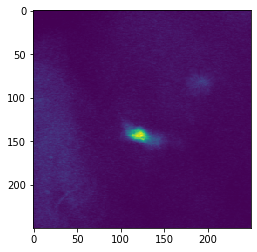

In [104]:
plt.imshow(brain_green[:,:,50].T)

In [37]:
[i for i in os.listdir(dir_) if ".gz" not in i]

['210208_02_red_m.nii',
 '210216_04_red_o.nii',
 '210208_03_red_m.nii',
 '210218_02_red_m_m.nii',
 '210218_02_red_m.nii',
 '210223_02_red_m.nii',
 '210223_02_red_o_m.nii',
 '210223_02_red_m_m.nii',
 '210208_03_red_m_m.nii',
 '210216_04_red_o_m.nii',
 '210208_03_red_o_m.nii',
 '210216_02_red_o_m.nii',
 '210208_03_red_o.nii',
 '210223_01_red_o_m.nii',
 '210223_01_red_m.nii',
 '210216_04_red_m.nii',
 '210216_02_red_o.nii',
 '210223_01_red_o.nii',
 '210216_02_red_m_m.nii',
 '210223_03_red_o_m.nii']

In [312]:
dir_ = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/andrew_pipeline4/templates/syn_1.nii"
#os.listdir(dir_)
brain = ants.image_read(dir_)#,"210216_04_red_o.nii"))

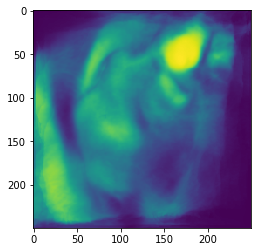

In [313]:
plt.imshow(brain[:,:,80].T)

In [308]:
brain

ANTsImage (LPI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (250, 250, 100)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.]

In [12]:
brain[:,:,50].shape

(250, 250)

In [184]:
### To make figure 1 need to screen shot individual brains

dir_ = "/oak/stanford/groups/trc/data/Alex/albert_data/LC11/func/raw"
dir_ = "/oak/stanford/groups/trc/data/Alex/albert_data/LC11/anat/raw"

#dir_ = "/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20220704_LC11/"
os.listdir(dir_)

['220426_LC11_vol2_local_atlas_red.nii',
 '220412_LC11_vol1_local_atlas_red.nii',
 '220425_LC11_vol1_local_atlas_red.nii',
 '220420_LC11_vol2_local_atlas_red.nii',
 '220426_LC11_vol1_local_atlas_red.nii',
 '220420_LC11_vol1_local_atlas_red.nii',
 '220413_LC11_vol1_local_atlas_red.nii',
 '220419_LC11_vol2_local_atlas_red.nii']

In [185]:
#220426_LC11_vol2
#220412_LC11_vol1
#220425_LC11_vol1
#220420_LC11_vol2 # excessive green background
#220419_LC11_vol2
#220426_LC11_vol1
#220413_LC11_vol1


In [186]:
brain = ants.image_read(os.path.join(dir_,"220420_LC11_vol1_local_atlas_red.nii"))

In [187]:
brain

ANTsImage (LPI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (1024, 512, 299)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.]

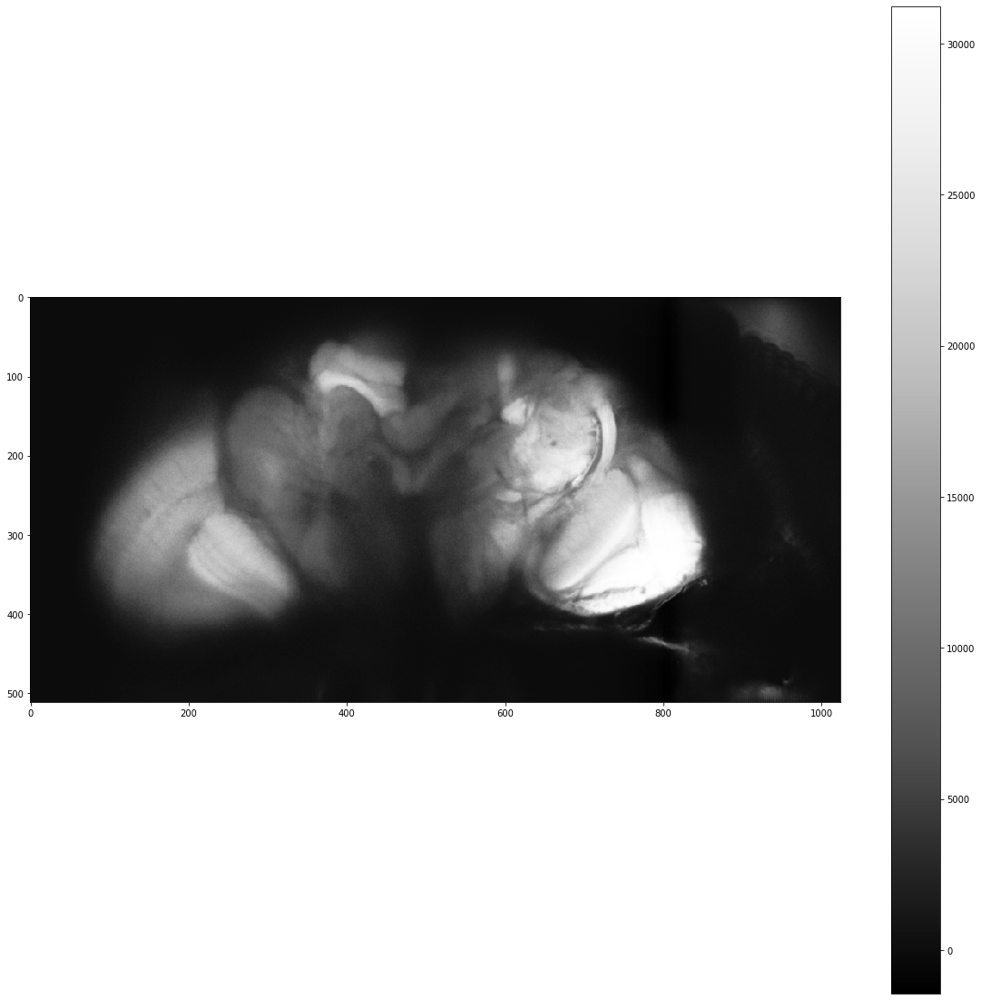

In [189]:
plt.figure(figsize=(20,20))
plt.imshow(brain[:,:,160].T,cmap='Greys_r')#,vmax=3000)
plt.colorbar()

In [254]:
dir_ = "/oak/stanford/groups/trc/data/berger/registration/dropbox/sama_male_atlases/raw_anats"
os.listdir(dir_)

['220127_local_atlas.nii',
 'mc_mean_20210615_2.nii',
 '220125_local_atlas.nii',
 'mc_mean_20210608_1.nii',
 'database - male fly atlas - samples.csv',
 '220515_2_local_atlas.nii',
 'mc_mean_20210630_1.nii',
 '220210_local_atlas.nii',
 'mc_mean_20210607_1.nii',
 '211207_local_atlas.nii',
 '220515_3_local_atlas.nii',
 'mc_mean_20210630_3.nii',
 'mc_mean_20210617_2.nii',
 '220517_1_local_atlas.nii']

In [ ]:
# 220127_local_atlas.nii - 1
# 220125_local_atlas.nii - 3
# 220515_2_local_atlas.nii -1
# 220210_local_atlas.nii
l

In [292]:
brain = ants.image_read(os.path.join(dir_,"220517_1_local_atlas.nii"))

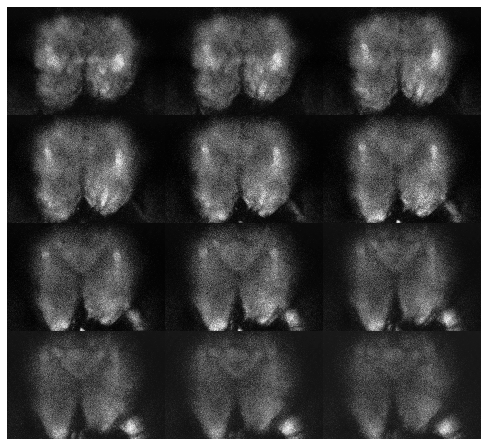

In [293]:
brain.plot(axis=2)

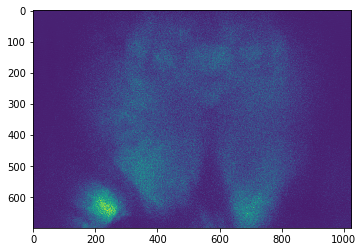

In [299]:
plt.imshow(brain[:,:,180].T)

In [222]:
#dir_ = "/oak/stanford/groups/trc/data/berger/registration/dropbox/meanbrain_building/syn_4.nii"
dir_ = "/oak/stanford/groups/trc/data/berger/registration/meanbrain_building/sama_male/templates"

os.listdir(dir_)
brain = ants.image_read(os.path.join(dir_,"syn_1.nii"))

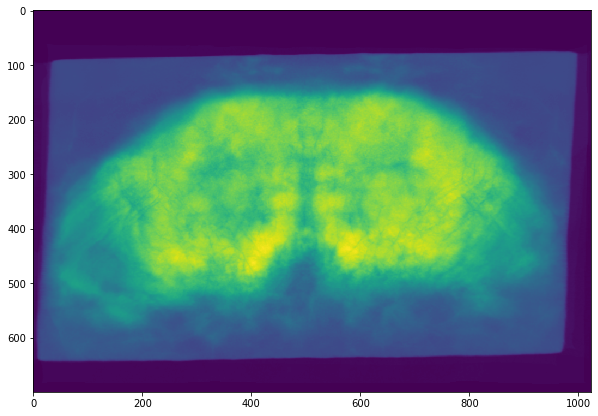

In [253]:
plt.figure(figsize=(10,10))
plt.imshow(brain[:,:,50].T)

In [224]:
brain

ANTsImage (RAI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (1024, 700, 249)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [1. 0. 0. 0. 1. 0. 0. 0. 1.]

In [334]:
#dir_ = "/oak/stanford/groups/trc/data/Alex/albert_data/LC11/anat/mbrain/templates/syn_1.nii"
dir_ = "/oak/stanford/groups/trc/data/Alex/clab_data/LC11/anat/templates/syn_1.nii"
#os.listdir(dir_)
brain = ants.image_read(dir_)

In [335]:
brain

ANTsImage (LPI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (1024, 512, 256)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.]

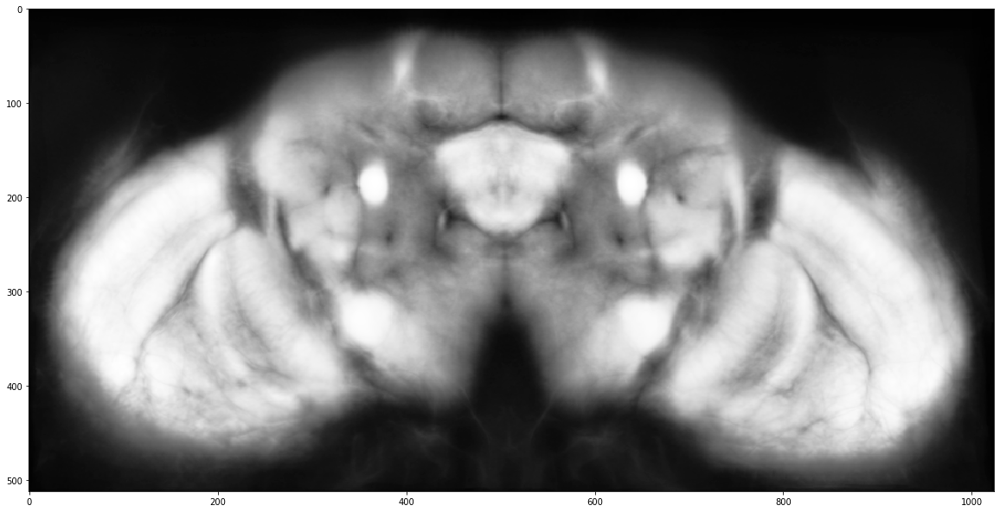

In [340]:
plt.figure(figsize=(20,20))
plt.imshow(brain[:,:,130].T,cmap="Greys_r")

In [342]:
os.listdir("/oak/stanford/groups/trc/data/Alex/clab_data/LC11/anat/raw")

['210216_04_red.nii',
 '210208_02_red.nii',
 '210208_03_red.nii',
 '210216_02_red.nii',
 '210223_03_red.nii',
 '210223_01_red.nii',
 '210218_02_red.nii',
 '210223_02_red.nii',
 '210223_04_red.nii']

In [371]:
os.listdir("/oak/stanford/groups/trc/data/Alex/clab_data/LC11/func")

['aligned_to_FDA',
 'average_green_LC11_clab_meanbrain_space.nii',
 'raw',
 'average_green_LC11_clab_fda.nii',
 'registered']

In [385]:
#dir_ = "/oak/stanford/groups/trc/data/Alex/clab_data/LC11/func/raw"
dir_ = "/oak/stanford/groups/trc/data/Alex/albert_data/LC11/func/raw"
#dir_ = "/oak/stanford/groups/trc/data/Alex/albert_data/LC11/anat/raw"
brains = []
for file in os.listdir(dir_):
    print(file)
    brain = ants.image_read(os.path.join(dir_,file))
    brains.append(brain)

220412_LC11_vol1_local_atlas_green.nii
220425_LC11_vol1_local_atlas_green.nii
220420_LC11_vol2_local_atlas_green.nii
220420_LC11_vol1_local_atlas_green.nii
220413_LC11_vol1_local_atlas_green.nii
220426_LC11_vol1_local_atlas_green.nii
220426_LC11_vol2_local_atlas_green.nii
220419_LC11_vol2_local_atlas_green.nii


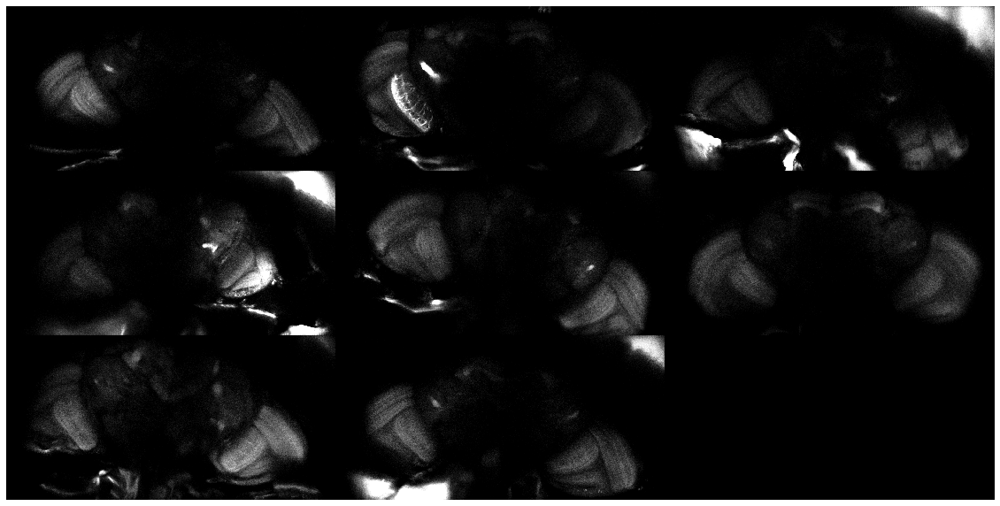

In [390]:
plt.figure(figsize=(20,20))
for i,brain in enumerate(brains):
    #i += 1
    #r = int(np.floor(i/3))
    #c = i%3
    #print(r,c)
    plt.subplot(3,3,i+1)
    plt.imshow(brains[i][:,:,150].T,cmap='Greys_r',vmin=100,vmax=3000)
    plt.axis('off')

# if 8 flies for albert data
plt.subplot(3,3,9)
plt.imshow(np.zeros(brains[0].shape)[:,:,150].T,cmap='Greys_r')
plt.axis('off')

plt.subplots_adjust(
                    wspace=0,
                    hspace=-.74)

In [345]:
np.floor(i/3)

0.0

In [5]:
dir_ = "/oak/stanford/groups/trc/data/Alex/clab_data/LC11/func/average_green_LC11_clab_fda.nii"
brain = ants.image_read(dir_)

In [6]:
brain

ANTsImage (LPI)
	 Pixel Type : float (float32)
	 Components : 1
	 Dimensions : (826, 384, 240)
	 Spacing    : (1.0, 1.0, 1.0)
	 Origin     : (0.0, 0.0, 0.0)
	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.]

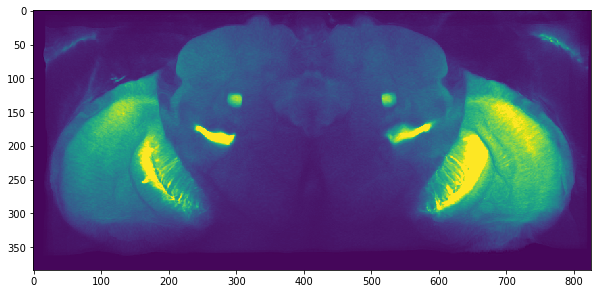

In [10]:
plt.figure(figsize=(10,10))
plt.imshow(brain[:,:,100].T,vmax=500)

In [14]:
FDA.shape

(1652, 768, 479)

In [17]:
brain.shape

(826, 384, 240)